In [88]:
!pip install -q kaggle

In [89]:
!pip install matplotlib 

In [90]:
!pip install opendatasets

In [91]:
import opendatasets as od

In [92]:
import tensorflow as tf
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
os.environ["KMP_SETTINGS"] = "false"

import numpy as np
import glob
from matplotlib import pyplot as plt
%matplotlib inline
import time
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model, Sequential
from tensorflow.keras.layers import Conv2D, BatchNormalization, LeakyReLU, Conv2DTranspose, Dropout, ReLU, Input, Concatenate, concatenate
from tqdm import tqdm

import pathlib
import datetime
from IPython import display

In [93]:
def read_png(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    return img

In [94]:
def split_image(image):
    w = tf.shape(image)[1]
    w = w // 2
    sketch_image = image[:, :w, :]
    colored_image = image[:, w:, :]
    sketch_image = tf.image.resize(sketch_image, (256, 256))
    colored_image = tf.image.resize(colored_image, (256, 256))
    return sketch_image, colored_image

In [95]:
def flip_image(image):
    return tf.image.flip_left_right(image)

In [96]:
def random_jitter(sketch_image, colored_image):
#     sketch_image, colored_image = resize(sketch_image, colored_image, 286, 286)

#     sketch_image, colored_image = random_crop(sketch_image, colored_image)

    if tf.random.uniform(()) > 0.5:
        sketch_image = flip_image(sketch_image)
        colored_image = flip_image(colored_image)

    return sketch_image, colored_image

In [97]:
def normalize(sketch_image, colored_image):
    sketch_image = tf.cast(sketch_image, tf.float32)/127.5 - 1
    colored_image = tf.cast(colored_image, tf.float32)/127.5 - 1
    return sketch_image, colored_image

In [98]:
def load_image_train(image_path):
    image = read_png(image_path)
    sketch_image, colored_image = split_image(image)
    sketch_image, colored_image = random_jitter(sketch_image, colored_image)
    sketch_image, colored_image = normalize(sketch_image, colored_image)

    return colored_image, sketch_image

In [99]:
train_path = 'C:/Users/intel/Desktop/FYP/anime-sketch-colorization-pair/data/train/'
#train_path = '/content/data/train/'
train_images_path = [os.path.join(train_path, image_name) for image_name in os.listdir(train_path)]
print(len(train_images_path))

14224


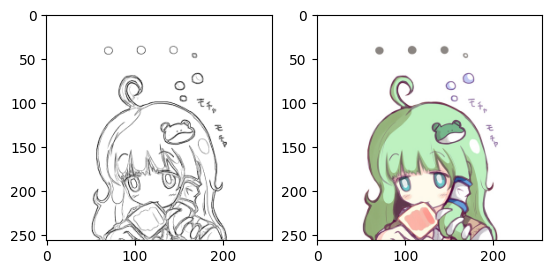

In [100]:
BATCH_SIZE = 4
BUFFER_SIZE = 400

train_dataset = tf.data.Dataset.from_tensor_slices(train_images_path)
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

for sketch, color in train_dataset.take(1):
    plt.subplot(1,2,1)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(sketch[0]))
    plt.subplot(1,2,2)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(color[0]))

In [101]:
def load_image_test(image_path):
    image = read_png(image_path)\
    
    sketch_image, colored_image = split_image(image)
    sketch_image, colored_image = normalize(sketch_image, colored_image)

    return colored_image, sketch_image

In [102]:
test_path = 'C:/Users/intel/Desktop/FYP/anime-sketch-colorization-pair/data/train/'
test_images_path = [os.path.join(test_path, image_name) for image_name in os.listdir(test_path)]
print(len(test_images_path))

14224


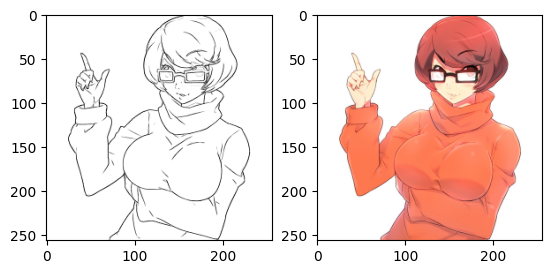

In [103]:
test_dataset = tf.data.Dataset.from_tensor_slices(test_images_path)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

for sketch, color in test_dataset.take(1):
    plt.subplot(1,2,1)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(sketch[0]))
    plt.subplot(1,2,2)
    plt.imshow(tf.keras.preprocessing.image.array_to_img(color[0]))

In [104]:
OUTPUT_CHANNELS = 3

In [105]:
def downsample(filters, size, apply_batchnorm=True):
    block = Sequential()
    block.add(Conv2D(filters, size, strides=2, padding='same', use_bias=False))

    if apply_batchnorm:
        block.add(BatchNormalization())
        
    block.add(LeakyReLU())

    return block

In [106]:
def upsample(filters, size, apply_dropout=False):
    block = Sequential()
    block.add(Conv2DTranspose(filters, size, strides=2, padding='same', use_bias=False))
    block.add(BatchNormalization())

    if apply_dropout:
        block.add(Dropout(0.5))

    block.add(ReLU())

    return block

In [107]:
def Generator():
    inp = Input(shape=[256,256,3])
    x = inp
    
    down_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]
    
    bottleneck = downsample(512, 4)
    # decoder stack
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]

    last_layer = Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same', activation='tanh')
    
    # Downsampling
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    x = bottleneck(x)
    skips.reverse()

    # Upsampling + creating skip connections for the i-th encoder and (n-i)-th decoder
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last_layer(x)

    return Model(inputs=inp, outputs=x)

In [108]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [109]:
def Discriminator():
    inp = Input(shape=[256, 256, 3], name='sketch_image')
    target = Input(shape=[256, 256, 3], name='colored_image')

    x = concatenate([inp, target])
    
    block_stack = [
        downsample(64, 4, apply_batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4)
    ]
    
    last_layer = Conv2D(1, 4, strides=1, padding='same')
    
    for block in block_stack:
        x = block(x)
    
    x = last_layer(x)

    return Model(inputs=[inp, target], outputs=x)

In [110]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [111]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
LAMBDA = 100

def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    return gan_loss + (LAMBDA * l1_loss)

In [112]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    
    return real_loss + generated_loss
    

In [113]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [114]:
def generate_images(model, test_input, target):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(16,16))
    
    # rearrange value of each image from [-1,1] to [0,1]
    # y = x/127.5 - 1 -> this is the formula to normalize image from [0, 255] to [-1,1]
    # x = (y + 1)*127.5 -> this return the normalized value from [-1, 1] to [0, 255]
    # x = 0.5y + 0.5 -> divide by 255 to normalize it into [0, 1]

    plt.subplot(1, 3, 1)
    plt.title("Sketch Image")
    plt.imshow(test_input[0]*0.5+0.5)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Target Image")
    plt.imshow(target[0]*0.5+0.5)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Predicted Image")
    plt.imshow(prediction[0]*0.5+0.5)
    plt.axis('off')
    
    plt.show()

In [115]:
# generator=tf.keras.models.load_model("../input/pix2pix-model/pix2pix_generator.h5")
# discriminator=tf.keras.models.load_model("../input/pix2pix-model/pix2pix_discriminator.h5")

In [116]:
EPOCHS = 30

In [117]:
@tf.function
def train_step(sketch_image, ground_truth, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generator_output = generator(sketch_image, training=True)

        disc_real_output = discriminator([sketch_image, ground_truth], training=True)
        disc_generated_output = discriminator([sketch_image, generator_output], training=True)

        gen_loss = generator_loss(disc_generated_output, generator_output, ground_truth)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))
    return gen_loss, disc_loss

In [118]:
epoch_loss_avg_gen = tf.keras.metrics.Mean('g_loss')
epoch_loss_avg_disc = tf.keras.metrics.Mean('d_loss')

In [119]:
generator_mean_losses = []
discriminator_mean_losses = []

In [120]:
def fit(train_ds, epochs, test_ds):
    for epoch in range(1, epochs+1):
        for example_input, example_target in test_ds.take(1):
            generate_images(generator, example_input, example_target)
        print("Epoch: ", epoch)
        
        for n, (sketch_image, colored_image) in tqdm(train_ds.enumerate()):
            g_loss, d_loss = train_step(sketch_image, colored_image, epoch)
            epoch_loss_avg_gen(g_loss)
            epoch_loss_avg_disc(d_loss)
             
        print()
        print("Generator Loss: %.2f" % epoch_loss_avg_gen.result().numpy())
        print("Discriminator Loss: %.2f" % epoch_loss_avg_disc.result().numpy())
        print("=====================================================")
        
        generator_mean_losses.append(epoch_loss_avg_gen.result().numpy())
        discriminator_mean_losses.append(epoch_loss_avg_disc.result().numpy())
        
        epoch_loss_avg_gen.reset_states()
        epoch_loss_avg_disc.reset_states()

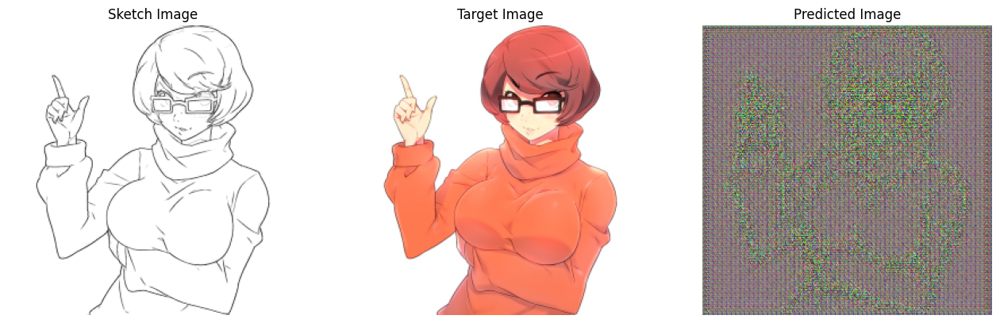

Epoch:  1


100%|██████████| 3556/3556 [45:47<00:00,  1.29it/s]



Generator Loss: 20.64
Discriminator Loss: 0.98


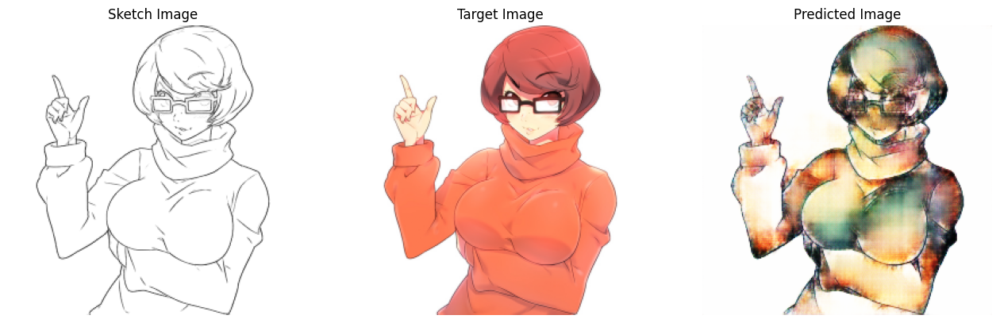

Epoch:  2


100%|██████████| 3556/3556 [45:53<00:00,  1.29it/s]



Generator Loss: 18.84
Discriminator Loss: 0.95


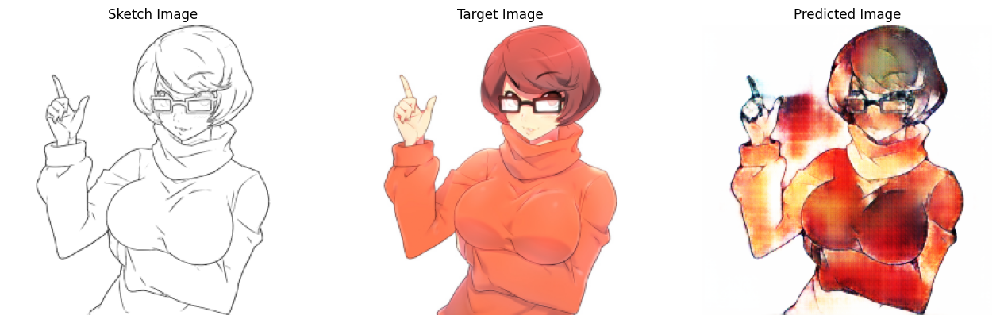

Epoch:  3


100%|██████████| 3556/3556 [46:06<00:00,  1.29it/s]



Generator Loss: 18.39
Discriminator Loss: 0.89


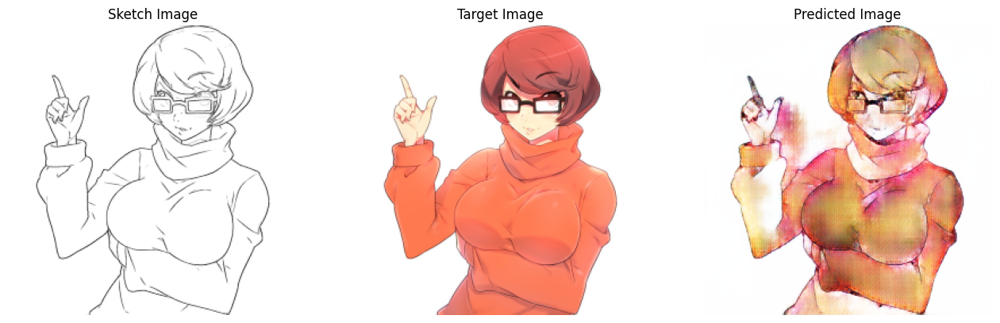

Epoch:  4


100%|██████████| 3556/3556 [46:08<00:00,  1.28it/s]



Generator Loss: 18.19
Discriminator Loss: 0.81


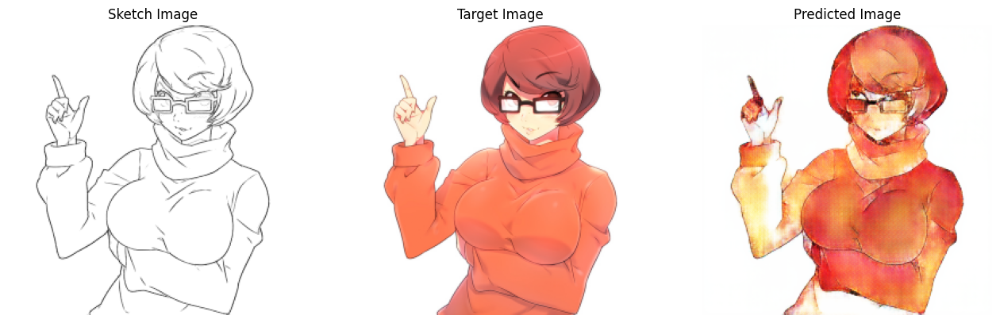

Epoch:  5


100%|██████████| 3556/3556 [46:10<00:00,  1.28it/s]



Generator Loss: 18.03
Discriminator Loss: 0.77


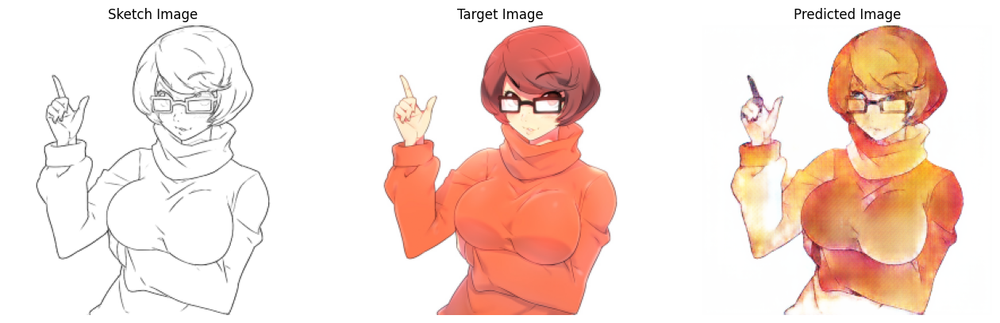

Epoch:  6


100%|██████████| 3556/3556 [46:15<00:00,  1.28it/s]



Generator Loss: 17.84
Discriminator Loss: 0.74


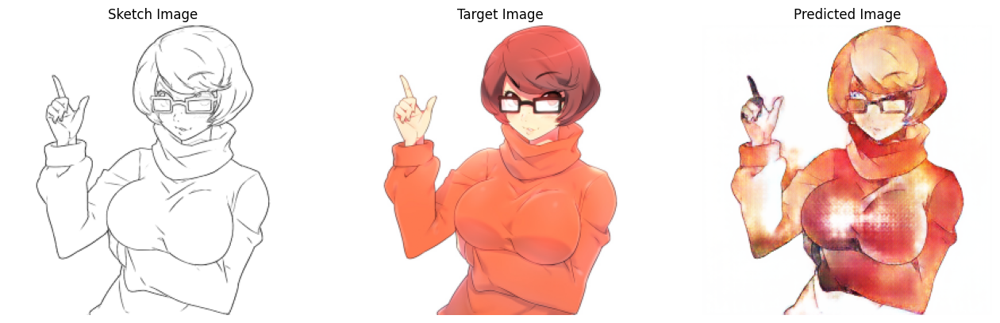

Epoch:  7


100%|██████████| 3556/3556 [46:06<00:00,  1.29it/s]



Generator Loss: 17.76
Discriminator Loss: 0.71


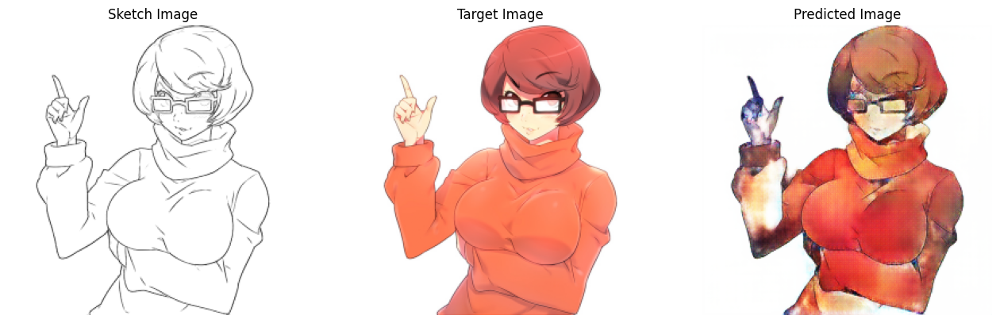

Epoch:  8


100%|██████████| 3556/3556 [45:48<00:00,  1.29it/s]



Generator Loss: 17.69
Discriminator Loss: 0.68


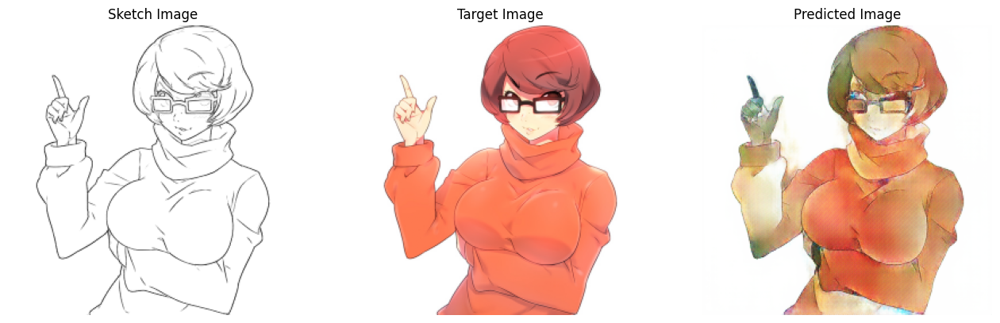

Epoch:  9


100%|██████████| 3556/3556 [45:55<00:00,  1.29it/s]



Generator Loss: 17.60
Discriminator Loss: 0.65


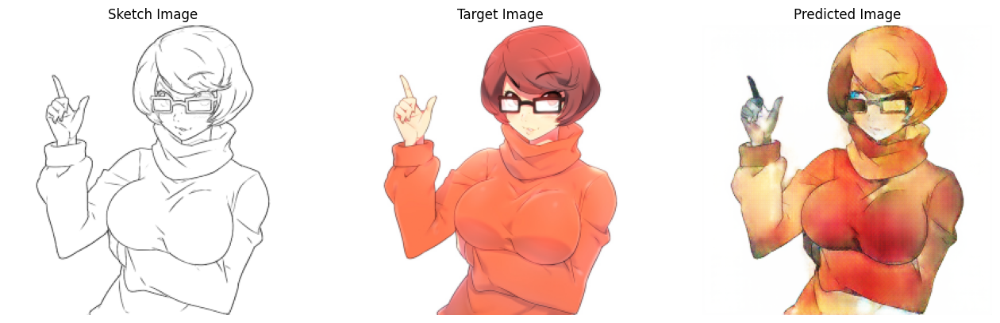

Epoch:  10


100%|██████████| 3556/3556 [46:00<00:00,  1.29it/s]



Generator Loss: 17.49
Discriminator Loss: 0.62


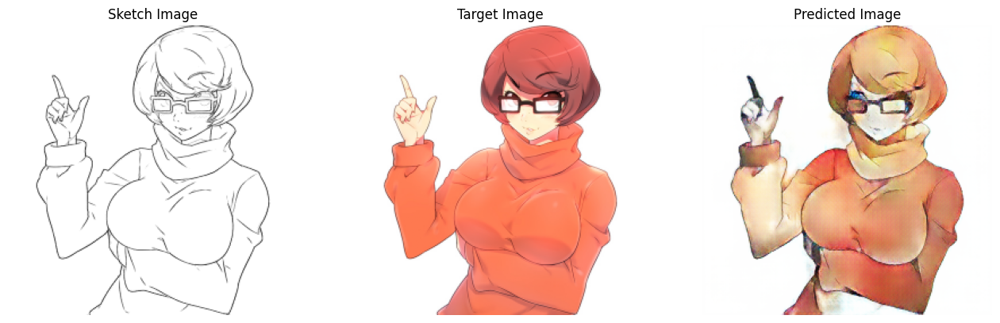

Epoch:  11


100%|██████████| 3556/3556 [46:02<00:00,  1.29it/s]



Generator Loss: 17.45
Discriminator Loss: 0.60


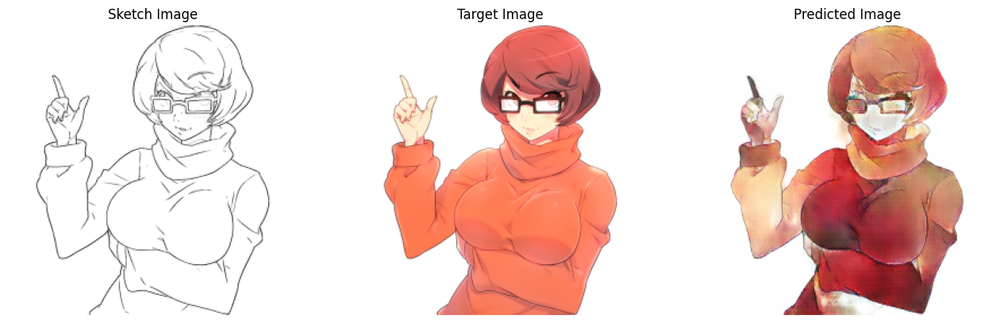

Epoch:  12


100%|██████████| 3556/3556 [46:00<00:00,  1.29it/s]



Generator Loss: 17.32
Discriminator Loss: 0.59


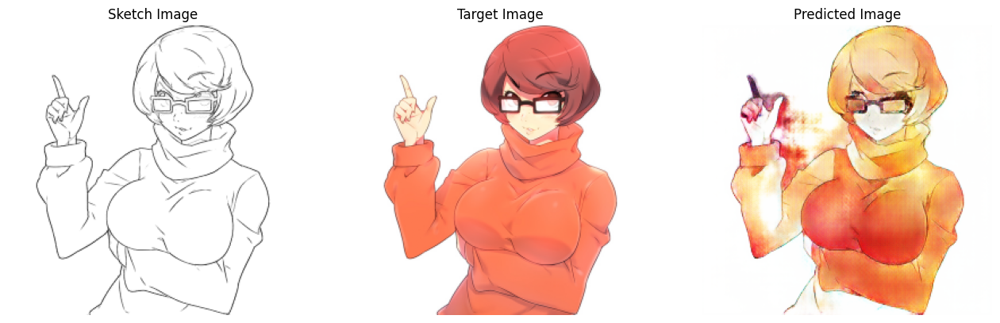

Epoch:  13


100%|██████████| 3556/3556 [46:09<00:00,  1.28it/s]



Generator Loss: 17.30
Discriminator Loss: 0.56


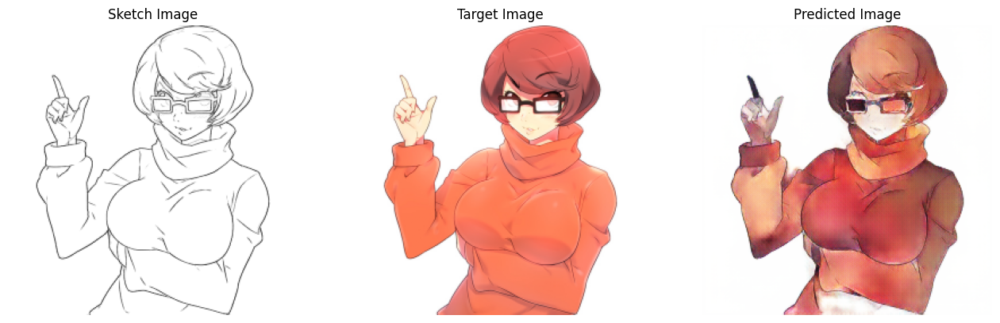

Epoch:  14


100%|██████████| 3556/3556 [45:49<00:00,  1.29it/s]



Generator Loss: 17.22
Discriminator Loss: 0.55


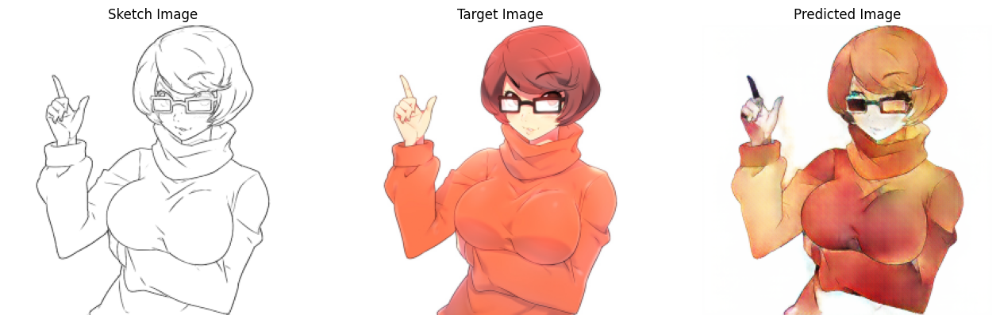

Epoch:  15


100%|██████████| 3556/3556 [45:59<00:00,  1.29it/s]



Generator Loss: 17.05
Discriminator Loss: 0.54


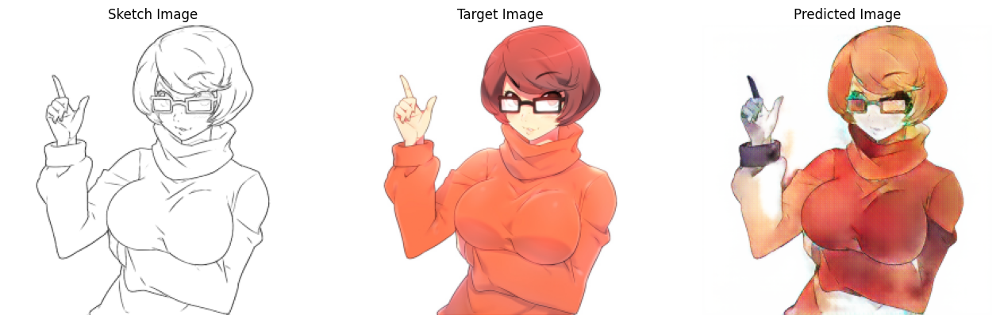

Epoch:  16


100%|██████████| 3556/3556 [45:53<00:00,  1.29it/s]



Generator Loss: 17.04
Discriminator Loss: 0.52


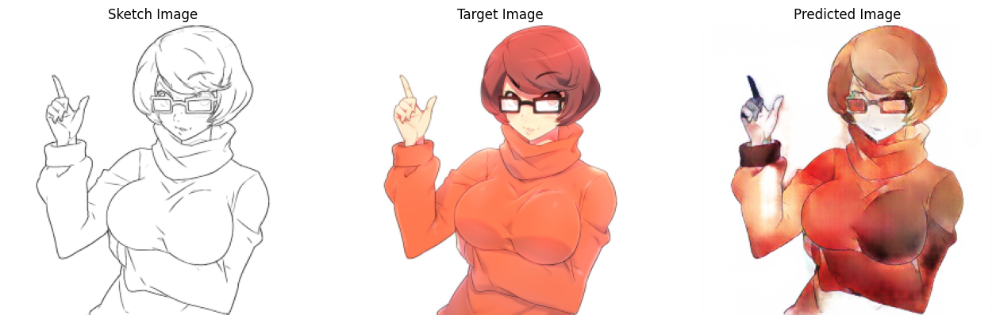

Epoch:  17


100%|██████████| 3556/3556 [46:17<00:00,  1.28it/s]



Generator Loss: 16.93
Discriminator Loss: 0.51


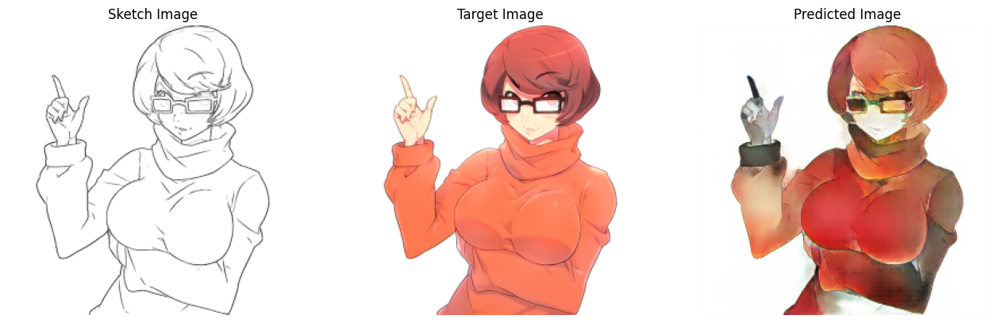

Epoch:  18


100%|██████████| 3556/3556 [47:02<00:00,  1.26it/s]



Generator Loss: 16.83
Discriminator Loss: 0.51


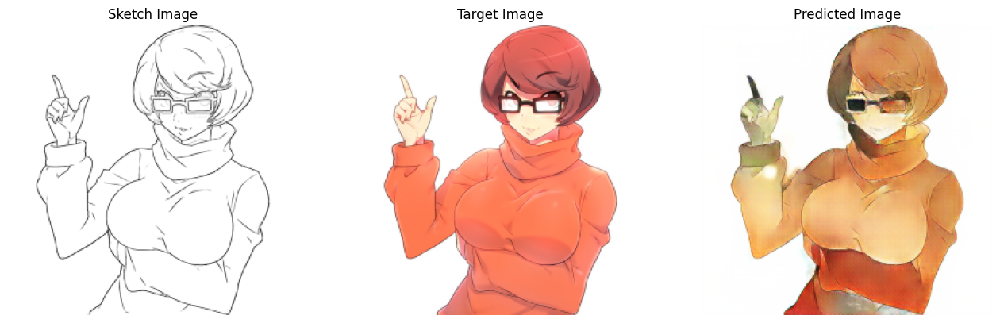

Epoch:  19


100%|██████████| 3556/3556 [48:47<00:00,  1.21it/s]



Generator Loss: 16.72
Discriminator Loss: 0.48


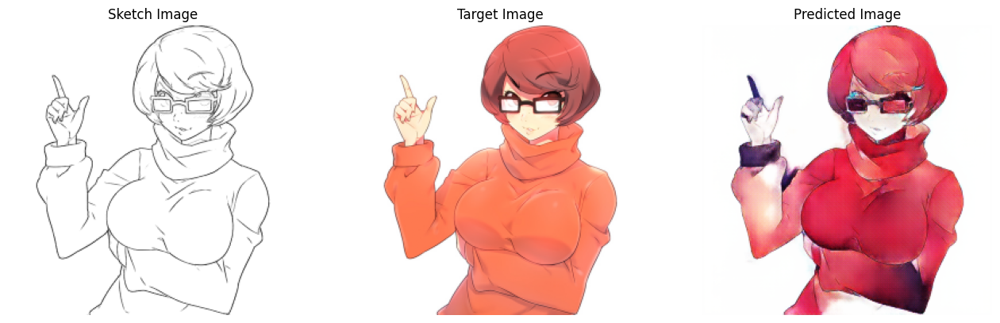

Epoch:  20


100%|██████████| 3556/3556 [48:54<00:00,  1.21it/s]



Generator Loss: 16.68
Discriminator Loss: 0.49


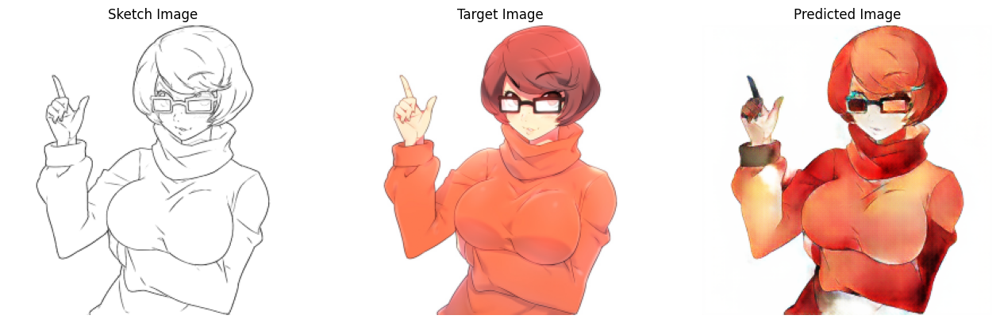

Epoch:  21


100%|██████████| 3556/3556 [50:50<00:00,  1.17it/s]



Generator Loss: 16.60
Discriminator Loss: 0.47


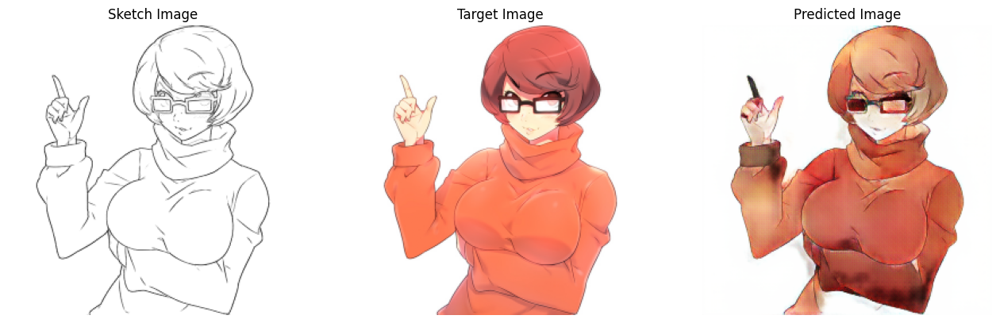

Epoch:  22


100%|██████████| 3556/3556 [48:42<00:00,  1.22it/s]



Generator Loss: 16.47
Discriminator Loss: 0.47


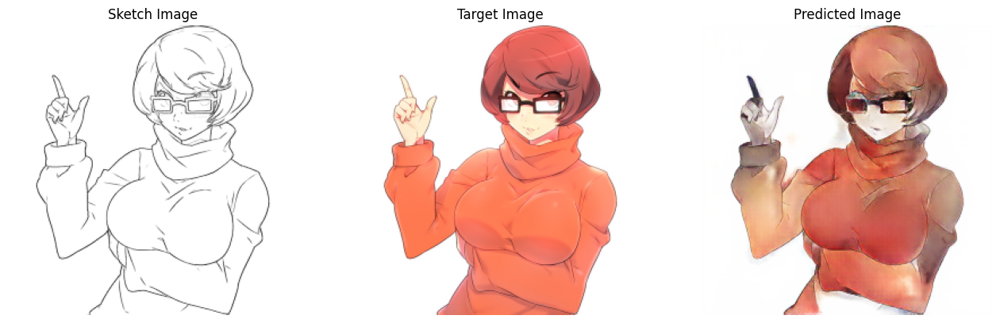

Epoch:  23


100%|██████████| 3556/3556 [47:52<00:00,  1.24it/s]



Generator Loss: 16.38
Discriminator Loss: 0.47


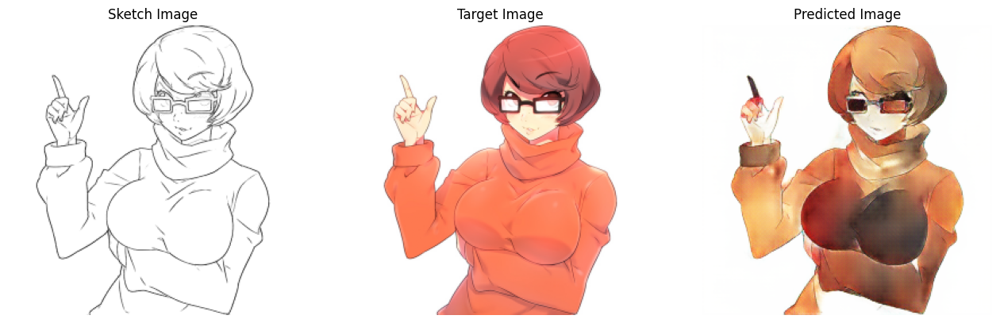

Epoch:  24


100%|██████████| 3556/3556 [48:56<00:00,  1.21it/s]



Generator Loss: 16.34
Discriminator Loss: 0.45


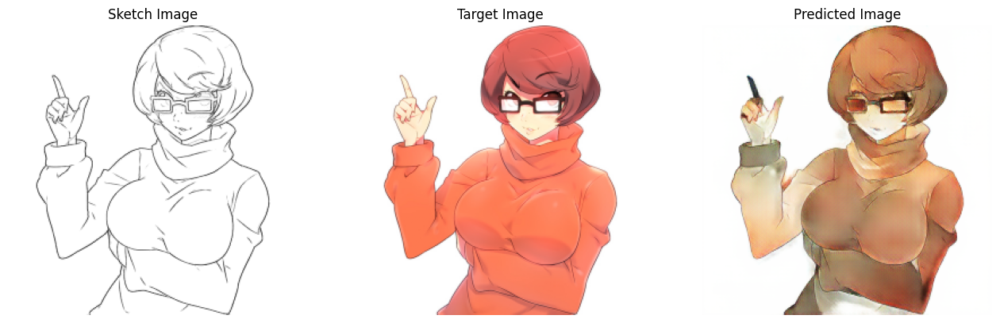

Epoch:  25


100%|██████████| 3556/3556 [1:25:56<00:00,  1.45s/it]



Generator Loss: 16.23
Discriminator Loss: 0.44


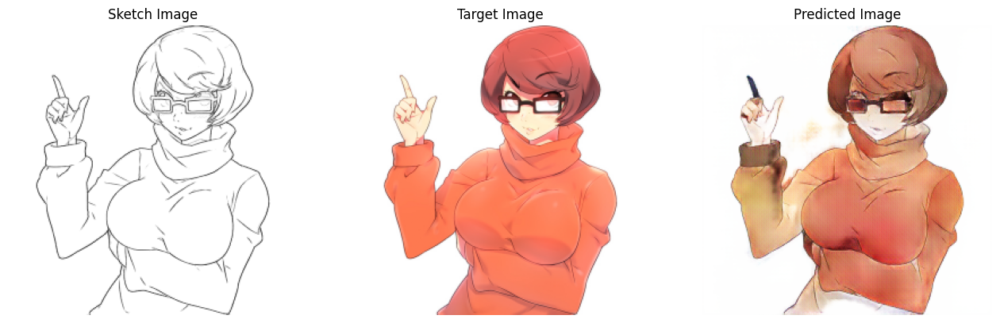

Epoch:  26


100%|██████████| 3556/3556 [2:24:40<00:00,  2.44s/it]  



Generator Loss: 16.20
Discriminator Loss: 0.45


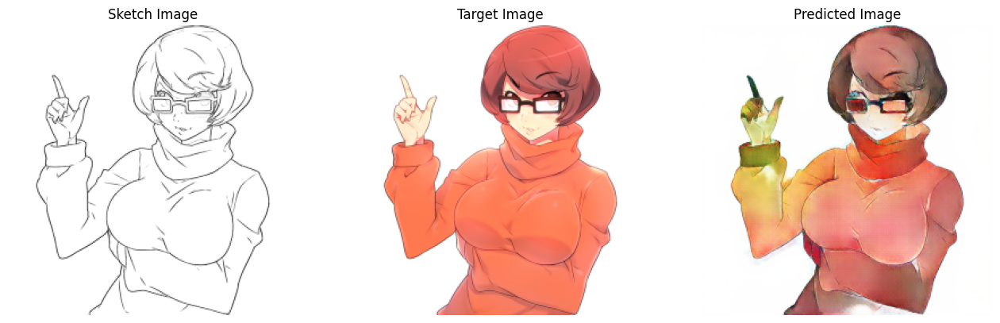

Epoch:  27


100%|██████████| 3556/3556 [2:07:41<00:00,  2.15s/it]  



Generator Loss: 16.13
Discriminator Loss: 0.44


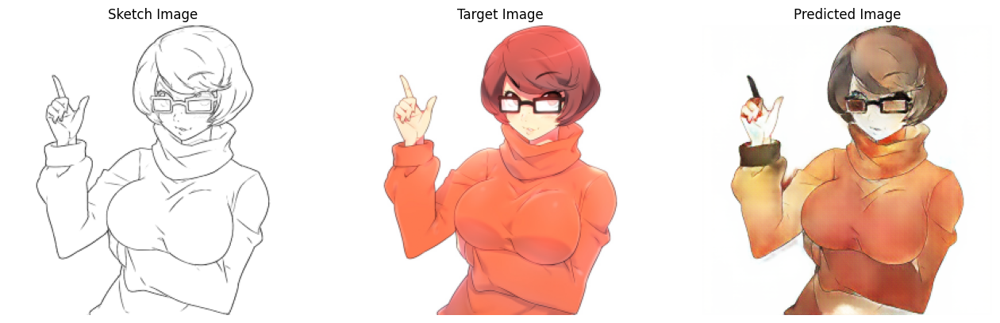

Epoch:  28


100%|██████████| 3556/3556 [47:34<00:00,  1.25it/s]



Generator Loss: 16.02
Discriminator Loss: 0.43


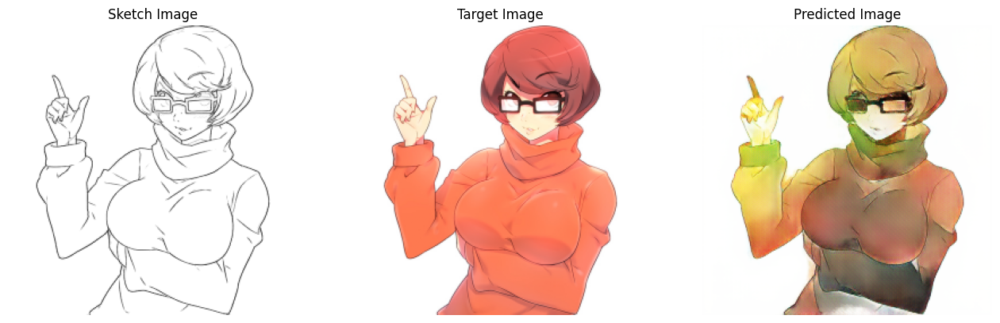

Epoch:  29


100%|██████████| 3556/3556 [47:08<00:00,  1.26it/s]



Generator Loss: 15.93
Discriminator Loss: 0.44


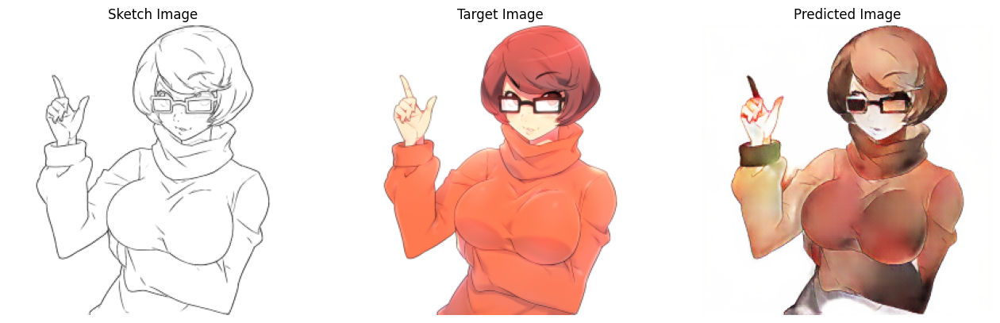

Epoch:  30


100%|██████████| 3556/3556 [46:14<00:00,  1.28it/s]


Generator Loss: 15.84
Discriminator Loss: 0.43


In [121]:
fit(train_dataset, EPOCHS, test_dataset)

In [122]:
generator.save('pix2pix_generator.h5')
discriminator.save('pix2pix_discriminator.h5')

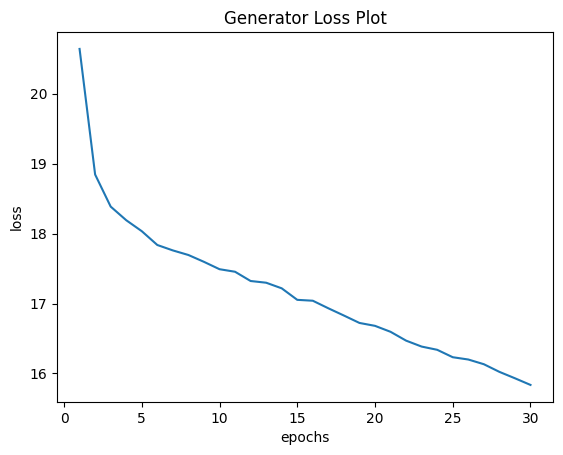

In [123]:
plt.plot(range(1,EPOCHS+1), generator_mean_losses)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.title('Generator Loss Plot')
plt.show()

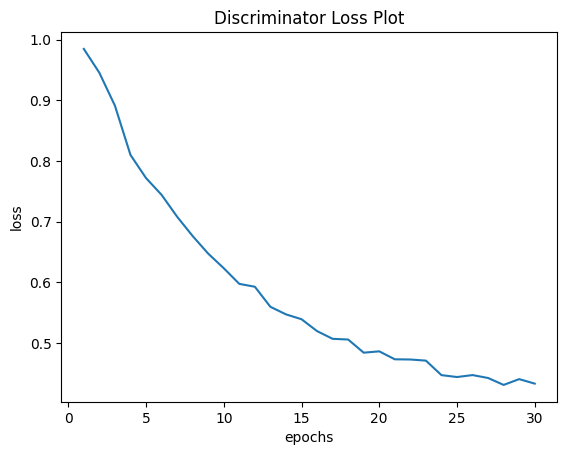

In [125]:
plt.plot(range(1,EPOCHS+1), discriminator_mean_losses)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.title('Discriminator Loss Plot')
plt.show()

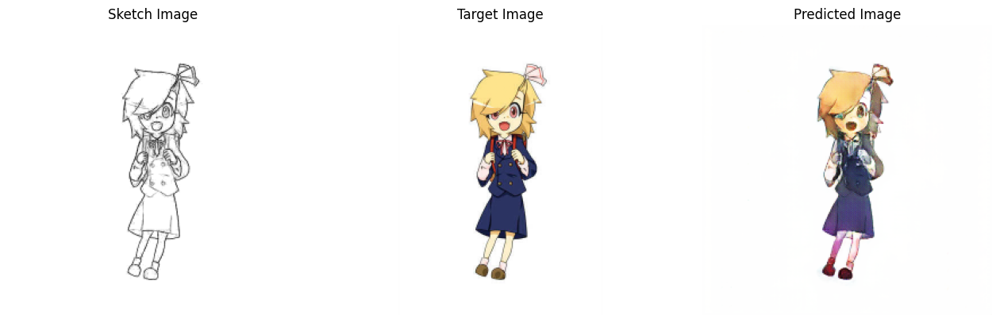

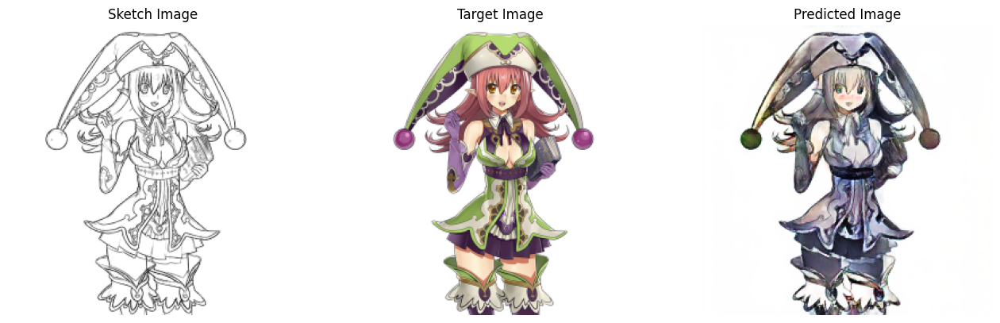

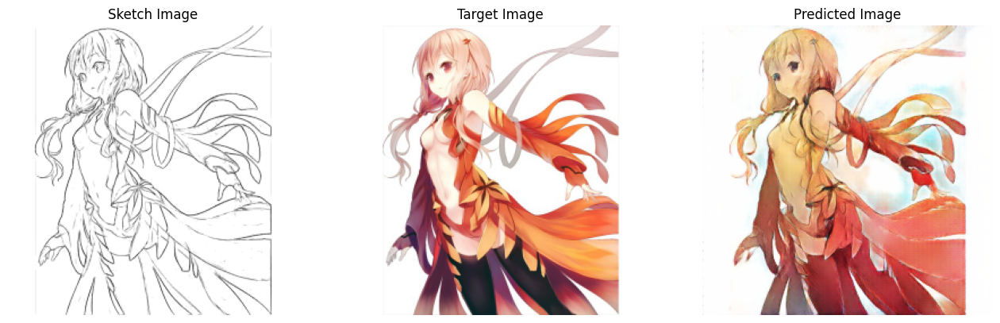

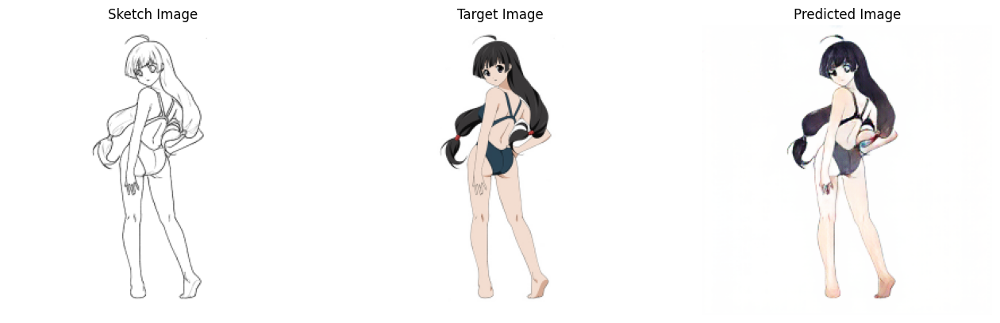

In [126]:
for n, data in enumerate(test_dataset):
    if(n>35 and n<40):
        sketch_image = data[0]
        ground_truth = data[1]
        generate_images(generator, sketch_image, ground_truth)
    elif (n>40):
        break

In [127]:
generator.save('pix2pix_generator.h5')
discriminator.save('pix2pix_discriminator.h5')

In [129]:
generator.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])


In [130]:
discriminator.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])


In [131]:
generator.save('pix2pix_generator.h5')
discriminator.save('pix2pix_discriminator.h5')